# Practical Session 2 : Mathematical Morphology and Histogram manipulations

The aim of this practical work is to get acquainted with mathematical morphology
transformations. Applying different operations with several structuring elements on
simple images will allow you understanding the actions, effects and properties of the
operations, the role of the structuring element, as well as the need for appropriate
pre-processing depending on the application at hand.

In this session, we will mainly focus on functions from the skimage.morphology package.

In [ ]:
#Dowmloading images
!wget https://perso.telecom-paristech.fr/rachddou/teaching_material/images.zip
!unzip -qq images.zip 
!rm images.zip
!rm -rf __MACOSX

--2021-10-29 09:02:39--  https://perso.telecom-paristech.fr/rachddou/teaching_material/images.zip
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.2.165, 2001:660:330f:2::a5
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.2.165|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22981078 (22M) [application/zip]
Saving to: ‘images.zip’

images.zip          100%[===================>]  21.92M  18.5MB/s    in 1.2s    

2021-10-29 09:02:41 (18.5 MB/s) - ‘images.zip’ saved [22981078/22981078]

replace images/bateau.tif? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
## imports
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import skimage.morphology as morpho
student = True

## Mathematical morphology

### The structuring element
The basic idea in mathematical orphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element. For example, it can take the shape of a square, a disk or a diamond, with a predefined radius.

Use the functions of the morpho library to visualize a disk structuring element of radius 3. 

[[0 0 0 1 0 0 0]
 [0 1 1 1 1 1 0]
 [0 1 1 1 1 1 0]
 [1 1 1 1 1 1 1]
 [0 1 1 1 1 1 0]
 [0 1 1 1 1 1 0]
 [0 0 0 1 0 0 0]]


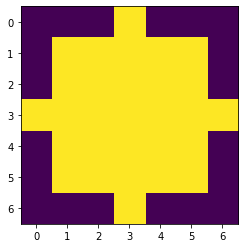

In [ ]:
if student :
  strell = morpho.disk(3)

print(strell)
plt.imshow(strell)
plt.show()

Find a way to create a vertical line as a structuring element with parameter length l :

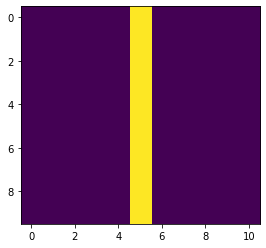

In [ ]:
def line_strell(l):
  if student :
    strell = morpho.rectangle(l, 1)
  return(strell)
if student : 
  l = 10
  im = np.zeros((l,2*(l//2)+1))
  strell_line = line_strell(l)
  im[:,l//2] = strell_line.T
  plt.imshow(im)
  plt.show()

### Binary Morphology
In this section, we will work on a cyto-image. Make sure to properly load the "cell.tif" image. Apply a thresholding of level t = 150 to that image to turn it into a binary image. Visualize the result in greyscale, by using the imshow function.

In [ ]:
def seuil(img, limit):
  return 255.0*(img <= limit)

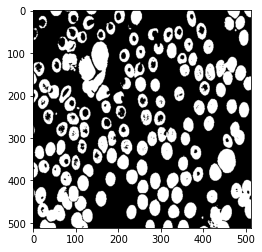

In [ ]:
#load the cell image in grayscale and display it 
if student:
  img = skio.imread("images/cell.tif")
  img = seuil(img, 150)
  plt.imshow(img, cmap='gray', vmin=0, vmax=255)

We will first start by applying simple binary morphological operations on those images. You will try the following operations:
- erosion
- dilation
- opening
- closing

You will try to visualize the results by varying the structuring element and its size.  

In [ ]:
def compareOperations(img, strell):
  print("Structuring element:")
  plt.imshow(strell, cmap='gray')
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  erosion = morpho.erosion(img, strell)
  dilation = morpho.dilation(img, strell)
  opening = morpho.opening(img, strell)
  closing = morpho.closing(img, strell)
  imgs = [erosion, dilation, opening, closing]# Add in this list the 4 images, obtained with the for operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()

Structuring element:


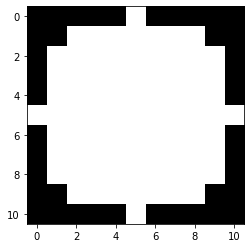

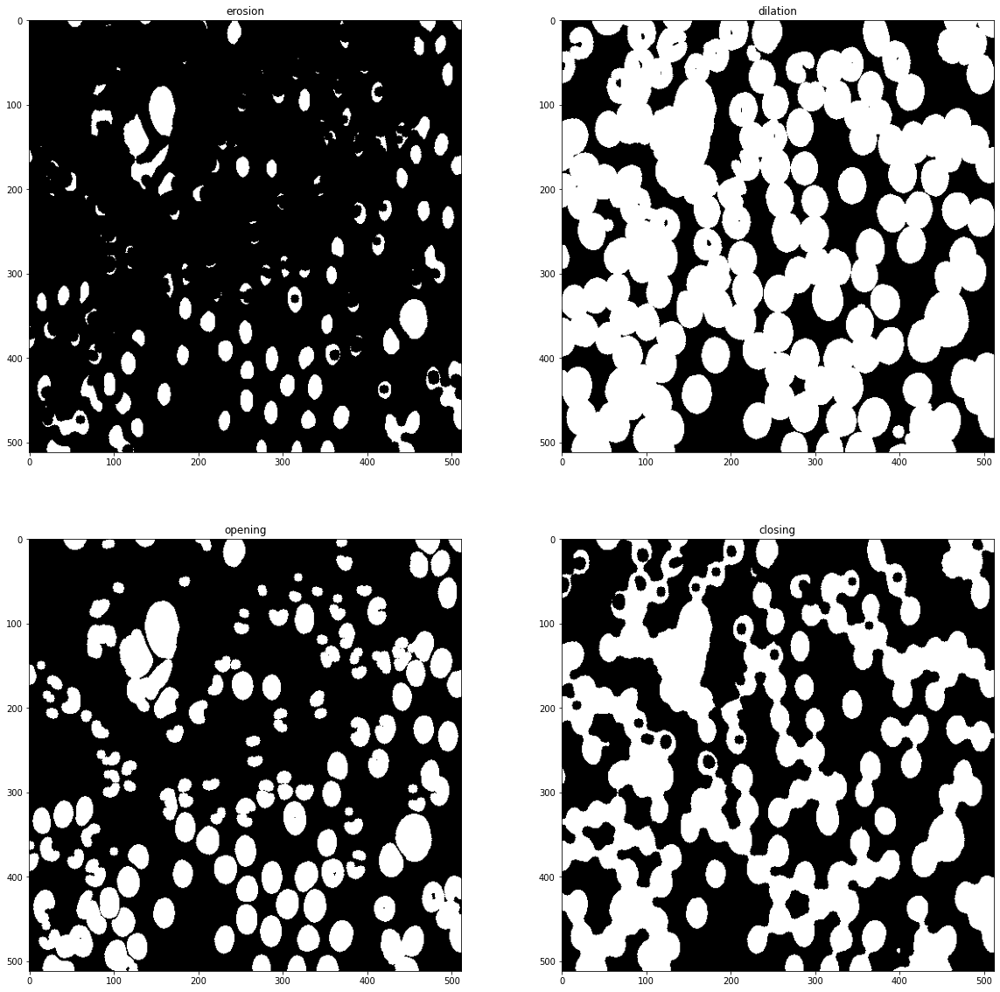

Structuring element:


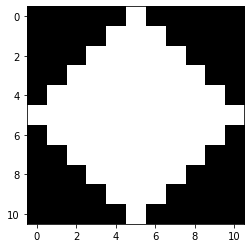

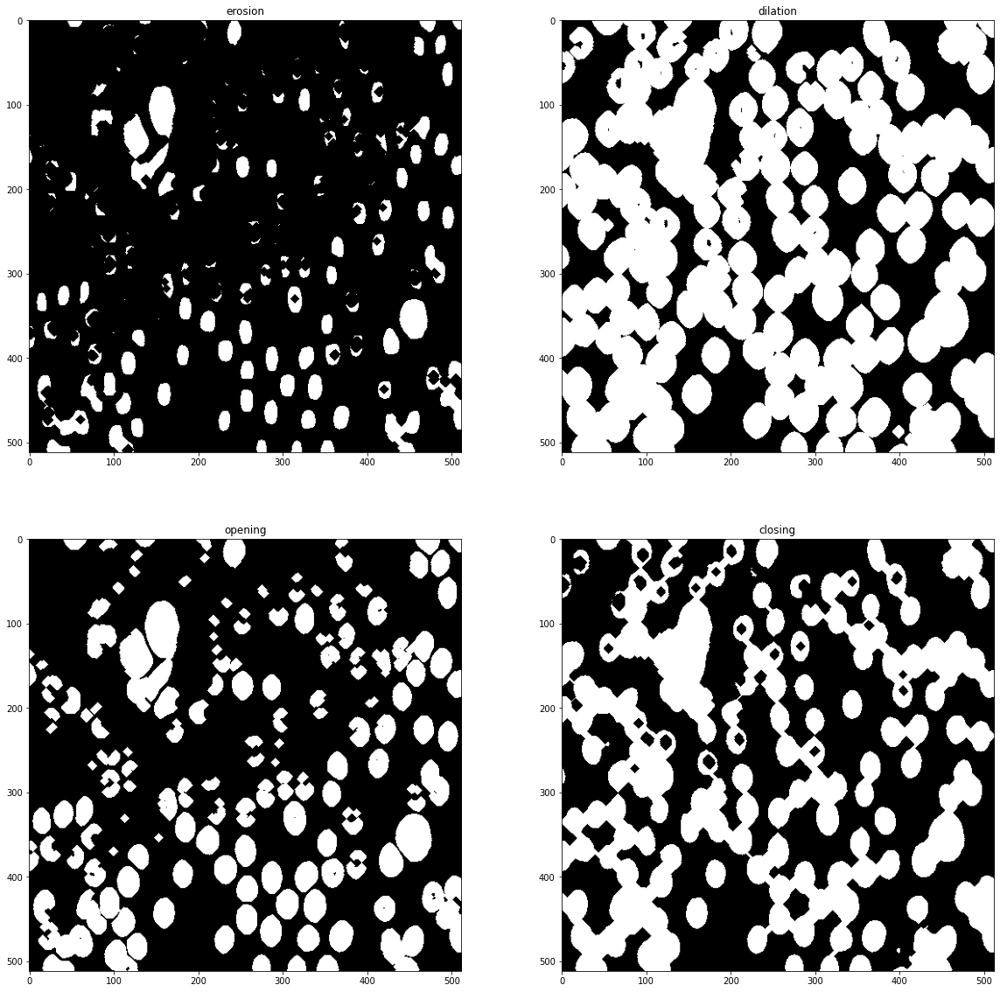

Structuring element:


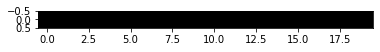

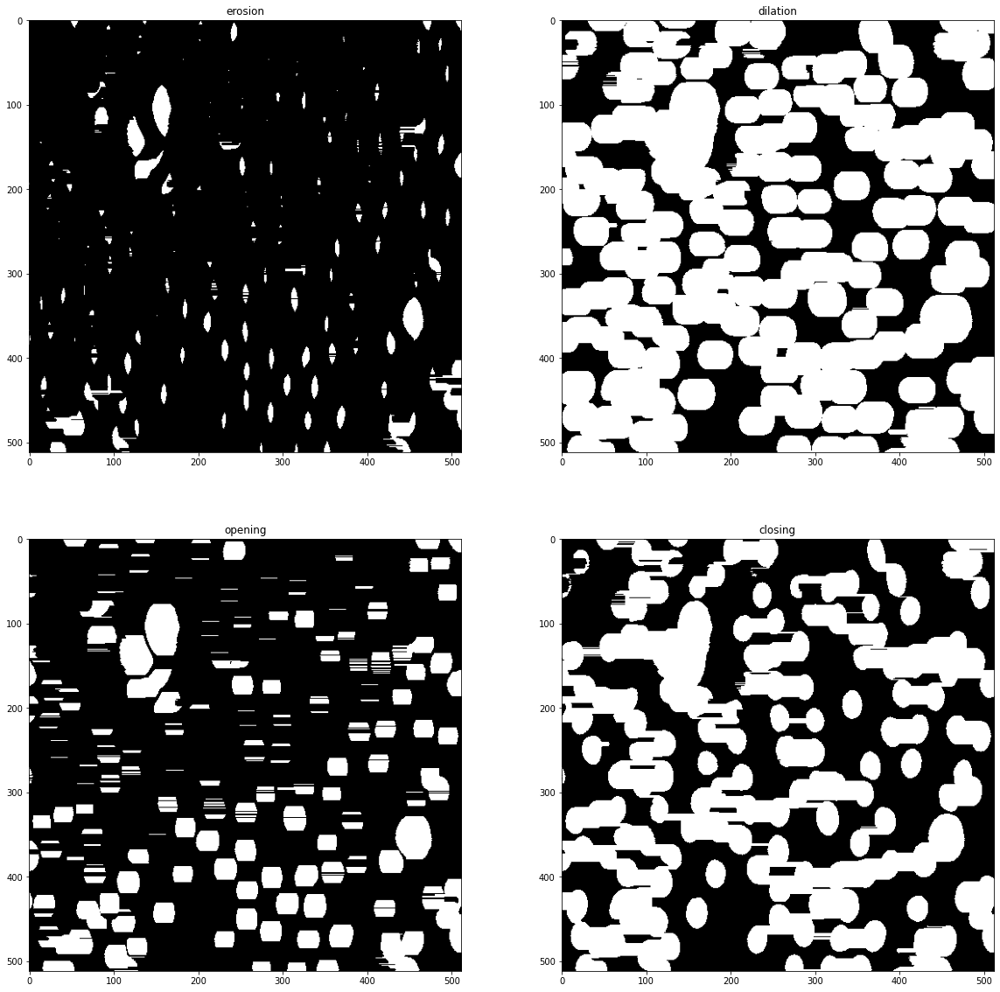

In [ ]:
compareOperations(img, morpho.disk(5))
compareOperations(img, morpho.diamond(5))
compareOperations(img, morpho.rectangle(1, 20))

- **Q** : What is the influence of the shape of the structuring element ?
- **A** : On peut voir l'élément structurant dans chaque image après l'érosion, dilatiation, aperture et fermeture.
Dans les cas d'érosion et fermeture (dilatation suit par érosion), on peut voir la forme de l'élément structurant dedans quelques cellules. Dans les cas de dilatation et ouverture (érosion suit par dilatation), on voit la forme de l'élément structurant dans les contours des cellules.
- **Q** : What is the influence of the size of the structuring element ?
- **A** : Dans les cas d'érosion et dilatation, la taille de l'élément structurant peut remplir complètement une cellule ou même la faire disparaître complètement, donc dans les cas d'ouverture et fermeture la taille va influencer la connectivité des cellules.

### Greyscale Morphology
In this section, we will use the bateau.tif image. Make sure to load it and visualize it in greyscale.


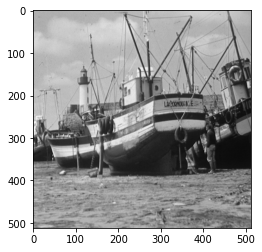

In [ ]:
#load the bateau image in grayscale and display it 
if student:
  img = skio.imread("images/bateau.tif")
  plt.imshow(img, cmap = "gray")
  plt.show()

Apply the same 4 operations as before (dilation,erosion,opening,closing) and visualize the results. Try out different structuring elements and different sizes. 

Structuring element:


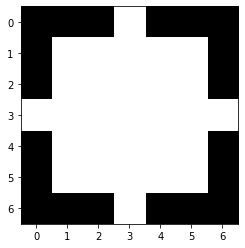

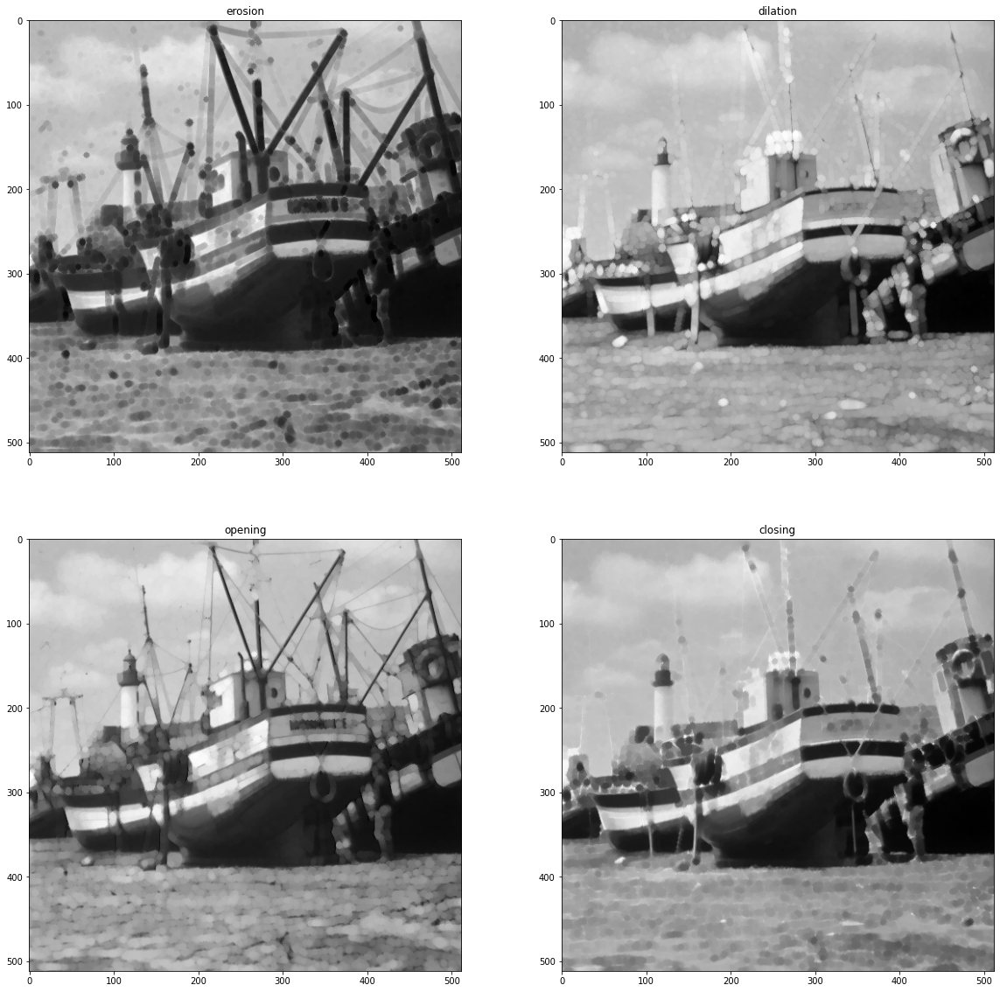

Structuring element:


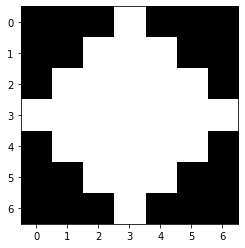

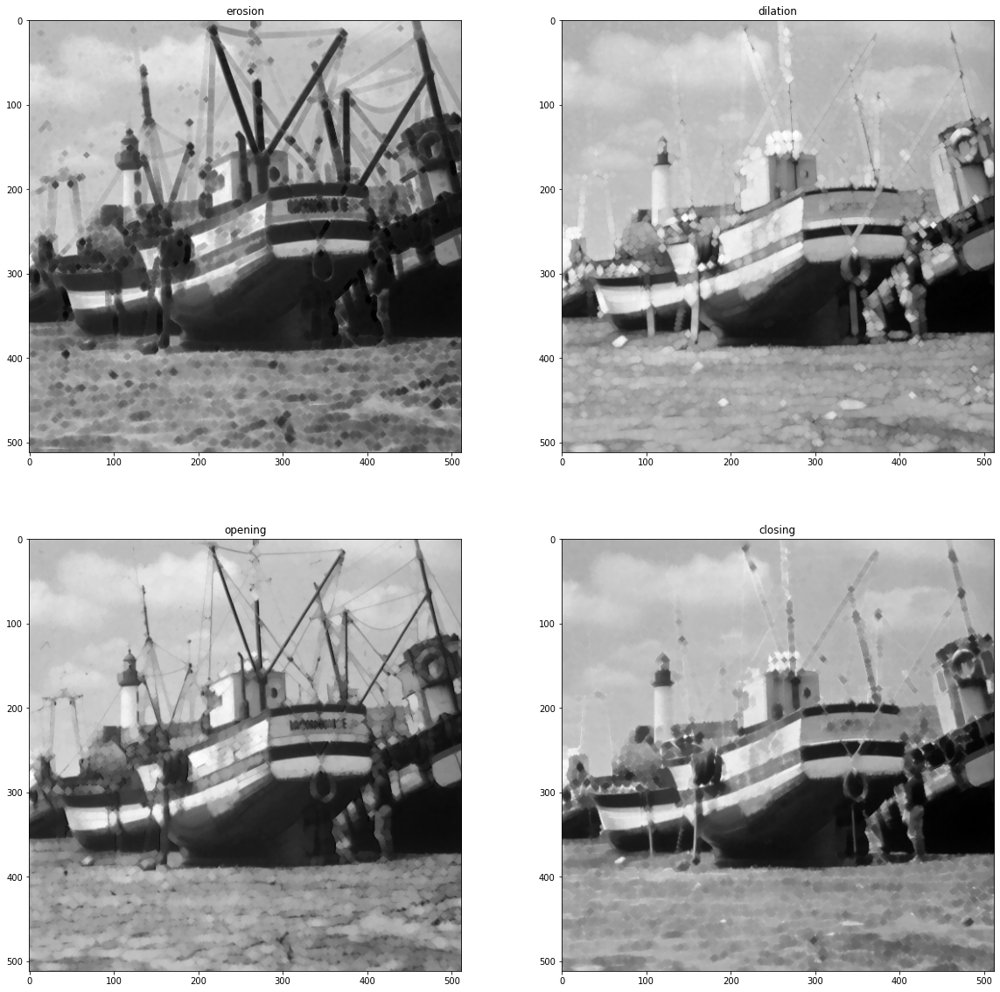

Structuring element:


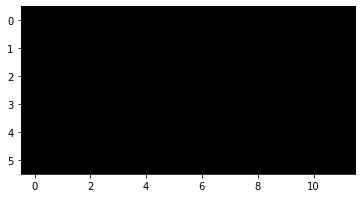

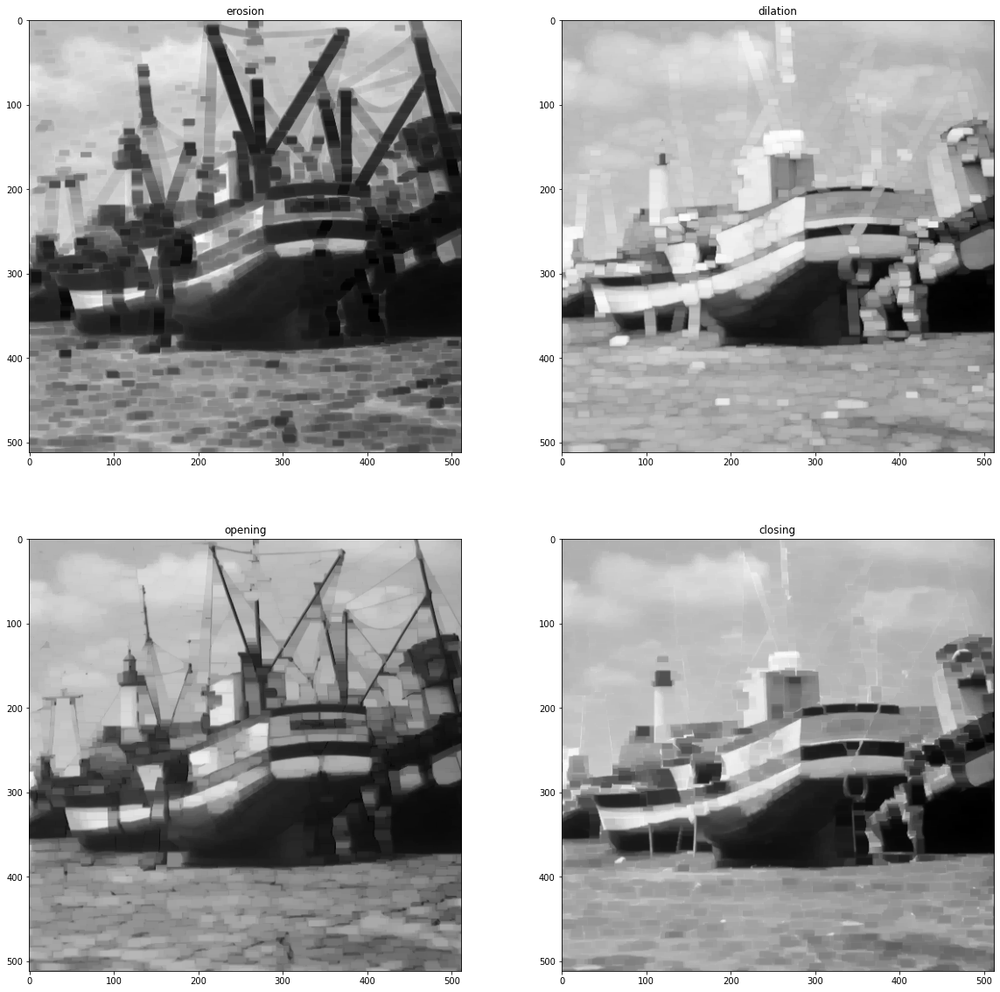

In [ ]:
compareOperations(img, morpho.disk(3))
compareOperations(img, morpho.diamond(3))
compareOperations(img, morpho.rectangle(6, 12))

- **Q** : What is the influence of the shape and size parameters of the structuring element ?
- **A** : La forme et la taille de l'élément structurant sont perçus partout dans l'image en tous les quatre cas. Une grande taille peut faire que quelques éléments de l'image (comme les pôles du bateau) disparaissent dans les cas de dilatation et fermeture. En première vue ça semble étrange (on pense que l'érosion doit érodir le batêau), mais en fait le ciel est l'élément dilaté, en occultant quelques parties du batêau.

- **Q** : How can you illustrate the iterativity property of the dilation ? What is the
result of a dilation by a structuring element of size 2 followed by a dilation by a
structuring element of size 3 (and same shape) ? Show your illustration in the next cell.
- **A** : La dilatation d'une image par B suivi par une dilatation par B' est la même chose que la dilatation d'une image par (B dilaté par B').
Si on dilate un disque de rayon 2 par un disque de rayon 3, le disque resultant sera un disque de rayon 5. Alors, dilater une image par un disque de rayon 2 et après par un disque de rayon 3 est la même chose que dilater l'image par un disque de rayon 5.

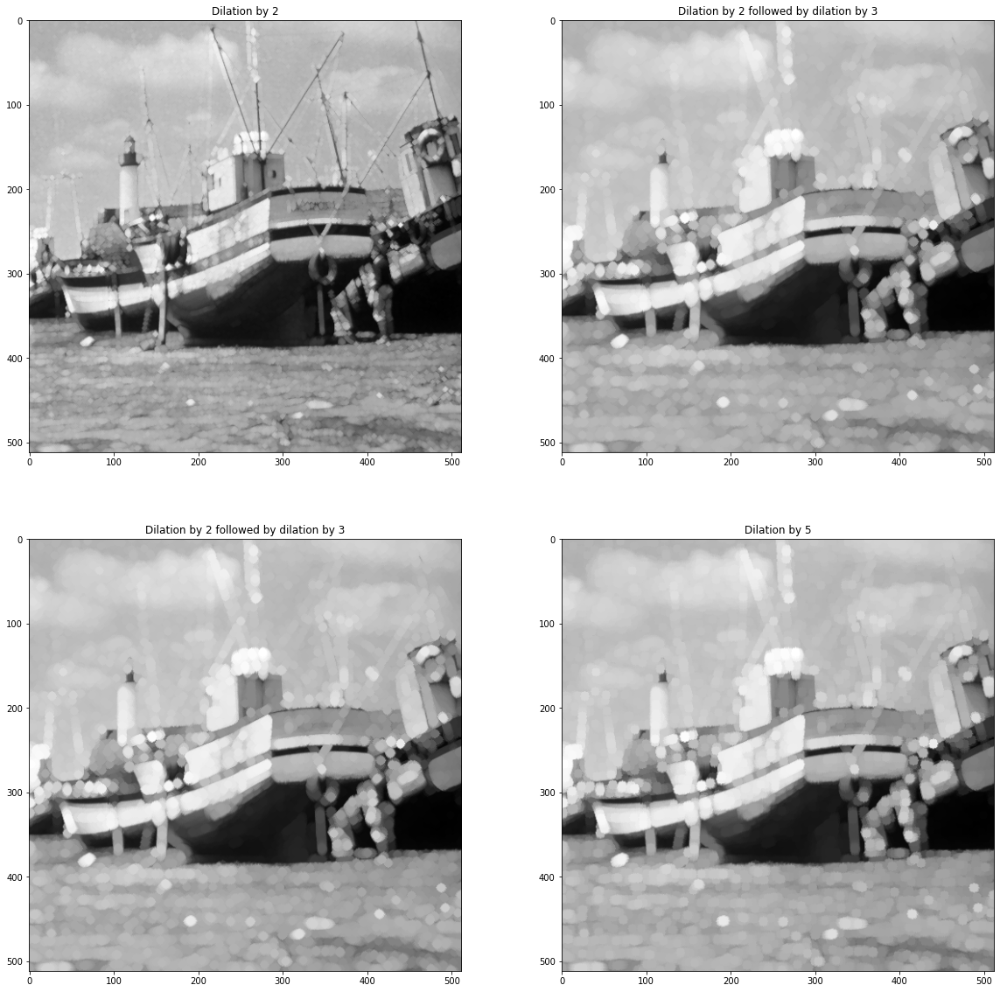

In [ ]:
fig,ax = plt.subplots(2, 2, figsize=(20,20))
firstDilation = morpho.dilation(img, morpho.disk(2))
secondDilation = morpho.dilation(firstDilation, morpho.disk(3))
dilationIteractivity = morpho.dilation(img, morpho.disk(5))
imgs = [firstDilation, secondDilation, secondDilation, dilationIteractivity]# Add in this list the 4 images, obtained with the for operations
names = ["Dilation by 2","Dilation by 2 followed by dilation by 3","Dilation by 2 followed by dilation by 3","Dilation by 5"]
for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
plt.show()

- **Q:** What is the result of an opening by a structuring element of size 2 followed by
an opening by a structuring element of size 3 (and same shape) ? Can you show it experimentally ? Explain.
- **A:** C'est la même chose qu'une ouverture seulement par 3. L'ouverture a la proprieté suivante: X_n_n' = X_n'_n = X_max(n,n').

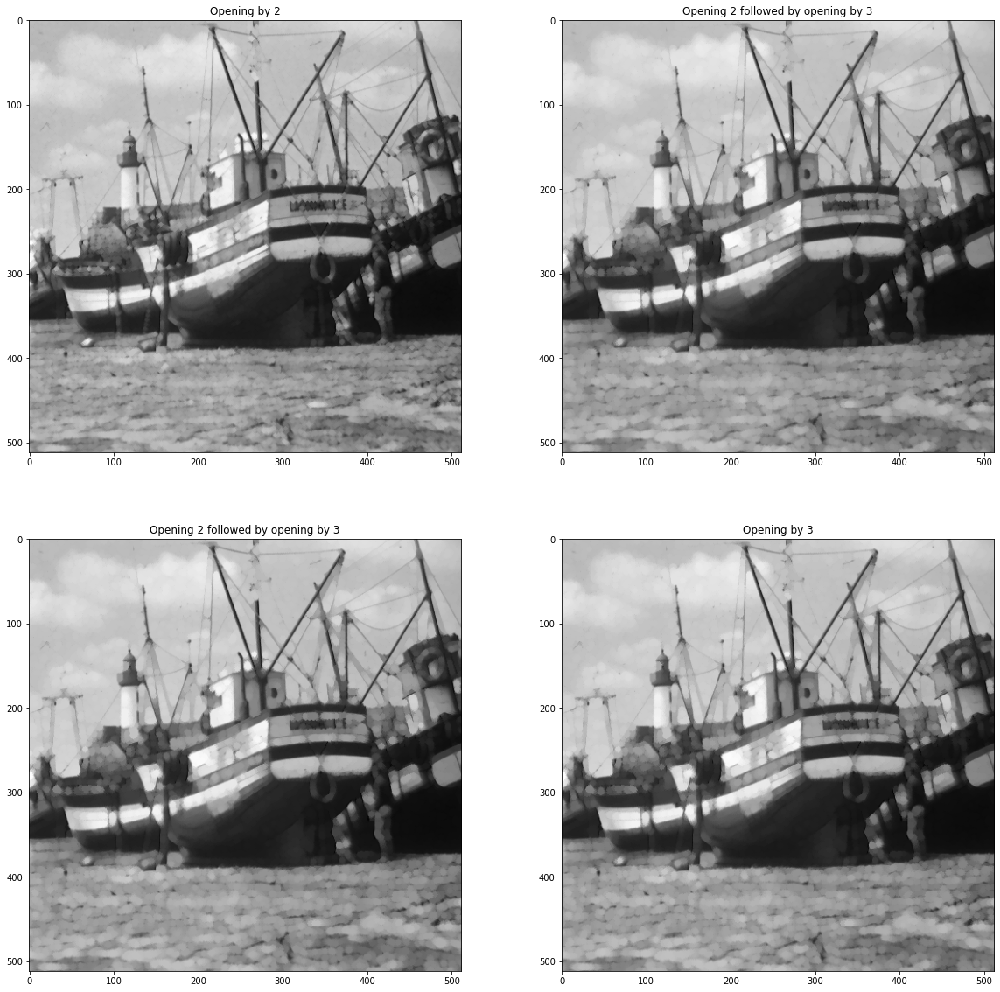

In [ ]:
fig,ax = plt.subplots(2, 2, figsize=(20,20))
firstOpening = morpho.opening(img, morpho.disk(2))
secondOpening = morpho.opening(firstOpening, morpho.disk(3))
openingIteractivity = morpho.opening(img, morpho.disk(3))
imgs = [firstOpening, secondOpening, secondOpening, openingIteractivity]# Add in this list the 4 images, obtained with the for operations
names = ["Opening by 2","Opening 2 followed by opening by 3","Opening 2 followed by opening by 3","Opening by 3"]
for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
plt.show()

- **Q:** How can you illustrate the idempotence of closing ? Show your illustration in the following cell.


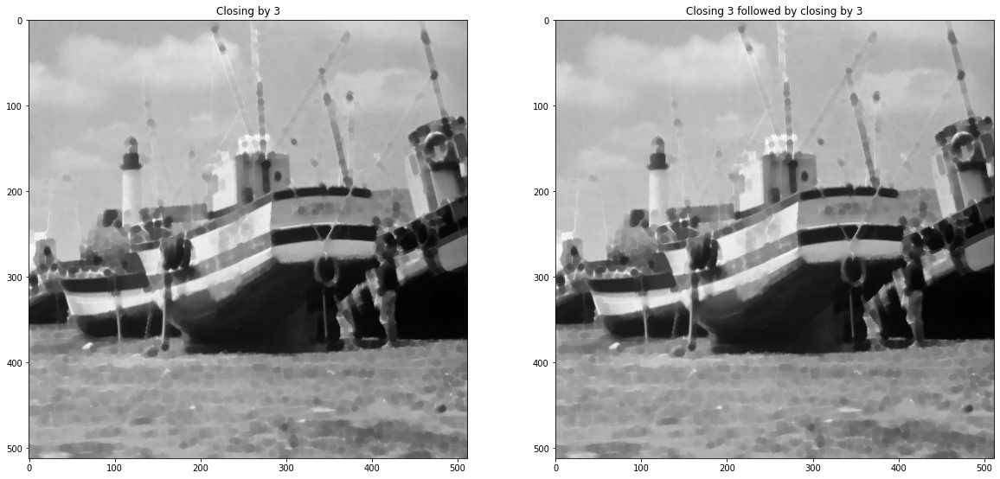

In [ ]:
fig,ax = plt.subplots(1, 2, figsize=(20,20))
firstClosing = morpho.closing(img, morpho.disk(3))
secondClosing = morpho.closing(firstClosing, morpho.disk(3))
imgs = [firstClosing, secondClosing]
names = ["Closing by 3","Closing 3 followed by closing by 3"]
for i in range(2):
  ax[i%2].set_title(names[i])
  ax[i%2].imshow(imgs[i],cmap = "gray")
plt.show()

- **Q** : Perform a top-hat transform in the following cell (difference between the image and its opening).
Comment the result depending on the choice of the structuring element.
- **A** : La plus petite la taille de l'élément sctruturant, la plus fine la borde qu'on retrouve, mais si on augmente la taille on récupere les formes de l'image aussi. 

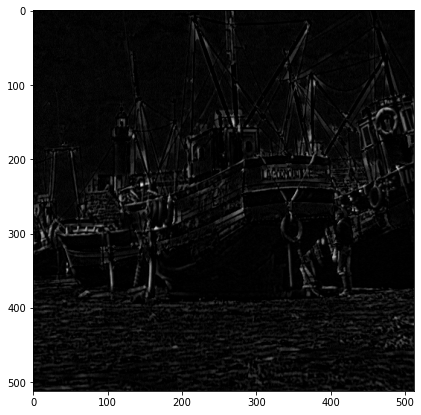

In [ ]:
strell = morpho.disk(3)
top_hat = morpho.white_tophat(img, strell)
plt.figure(figsize = (7,7))
plt.imshow(top_hat,cmap = "gray")
plt.show()

- **Q** : Perform a dual top-hat transform in the following cell (difference between the closing and the image).
Comment the result depending on the choice of the structuring element.
- **A** : ...

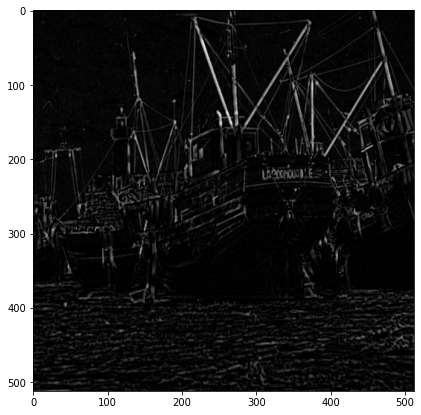

In [ ]:
strell = morpho.disk(3)
dual_top_hat = morpho.black_tophat(img, strell)
plt.figure(figsize = (7,7))
plt.imshow(dual_top_hat,cmap = "gray")
plt.show()

### Alternating Filters
- **Q**: Perform alternate sequential filters, for instance by using the following code and trying out your own combinations. What kind of filtering can be expected from such
operations?
- **A**:...

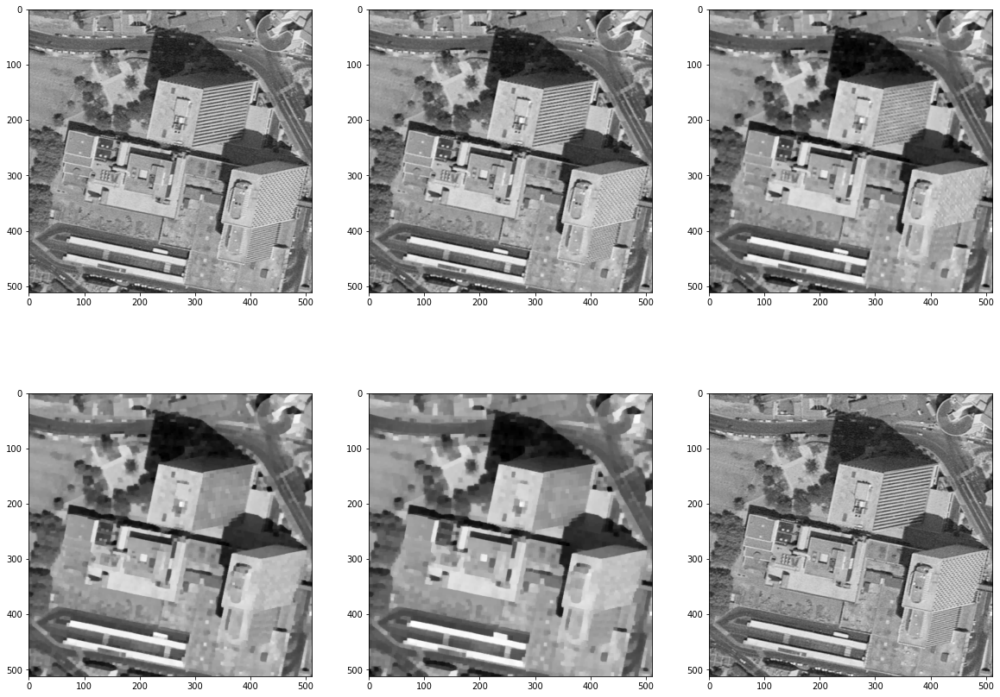

In [ ]:
# Example
img = skio.imread("images/montreuil.tif")
se1=morpho.square(1)
se2=morpho.square(2)
se3=morpho.square(3)
se4=morpho.square(4)
se5=morpho.square(5)
fas1=morpho.closing(morpho.opening(img,se1),se1)
fas2=morpho.closing(morpho.opening(fas1,se2),se2)
fas3=morpho.closing(morpho.opening(fas2,se3),se3)
fas4=morpho.closing(morpho.opening(fas3,se4),se4)
fas5=morpho.closing(morpho.opening(fas4,se5),se5)

fig,ax = plt.subplots(2,3,figsize = (20,15))
ax[0,0].imshow(fas1,cmap = "gray")
ax[0,1].imshow(fas2,cmap = "gray")
ax[0,2].imshow(fas3,cmap = "gray")
ax[1,0].imshow(fas4,cmap = "gray")
ax[1,1].imshow(fas5,cmap = "gray")
ax[1,2].imshow(img,cmap = "gray")
plt.show()

#Try you own
if student :
  ...
   

### Segmentation
 - **Q** : Apply a morphological gradient to the image cell.tif (difference between
dilation and erosion with a structuring element of radius1). What do you observe ?

- **A**: On obtiens les contours des cellules

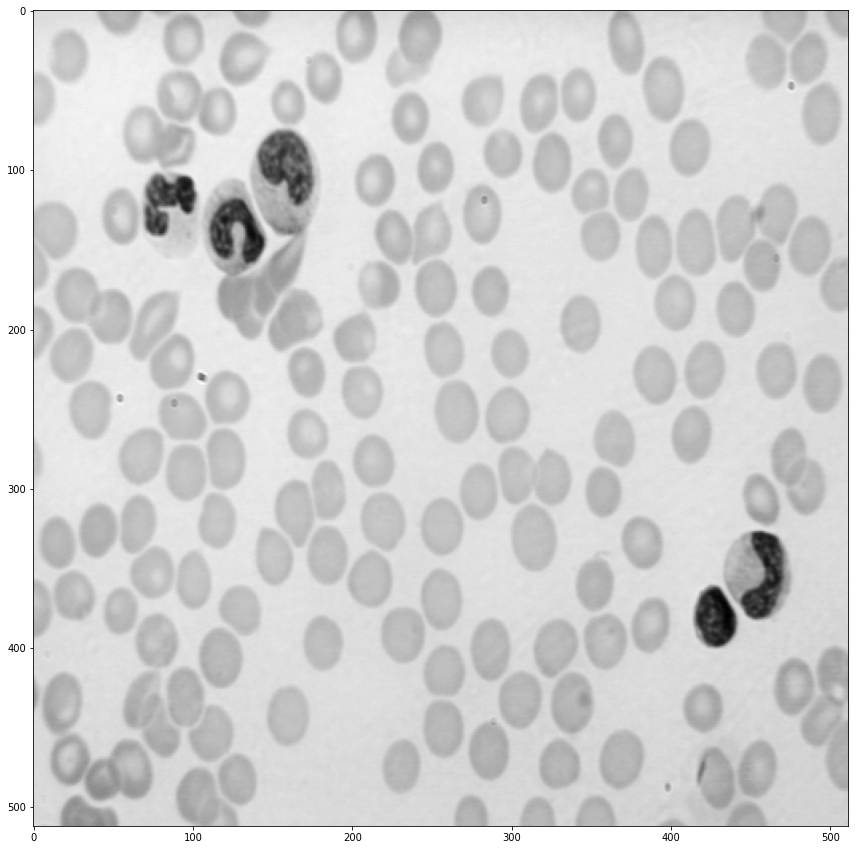

In [ ]:
img = skio.imread("images/cell.tif")
plt.figure(figsize=(15,15))
plt.imshow(img, cmap='gray')

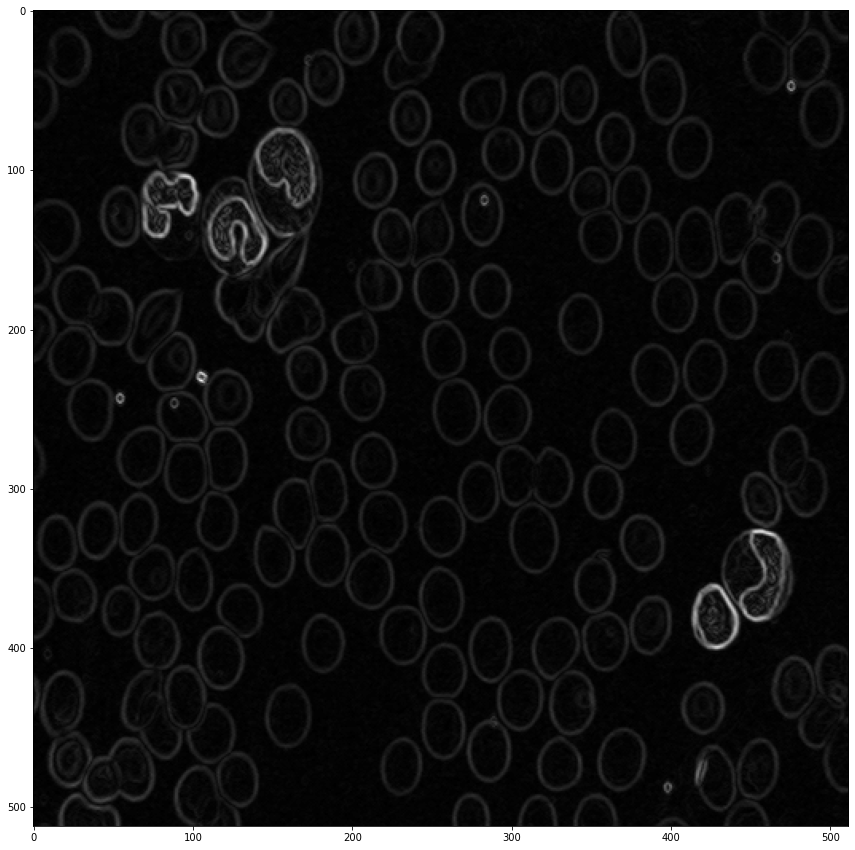

In [ ]:
strell = morpho.disk(1)
morpho_grad = morpho.dilation(img, strell) - morpho.erosion(img, strell)
plt.figure(figsize=(15,15))
plt.imshow(morpho_grad,cmap = "gray")
plt.show()


- **Q** : Try to threshold the gradient with a value of 25 for instance. Why is is difficult to find an appropriate threshold value ?
- **A** : (code in the next cell) ...

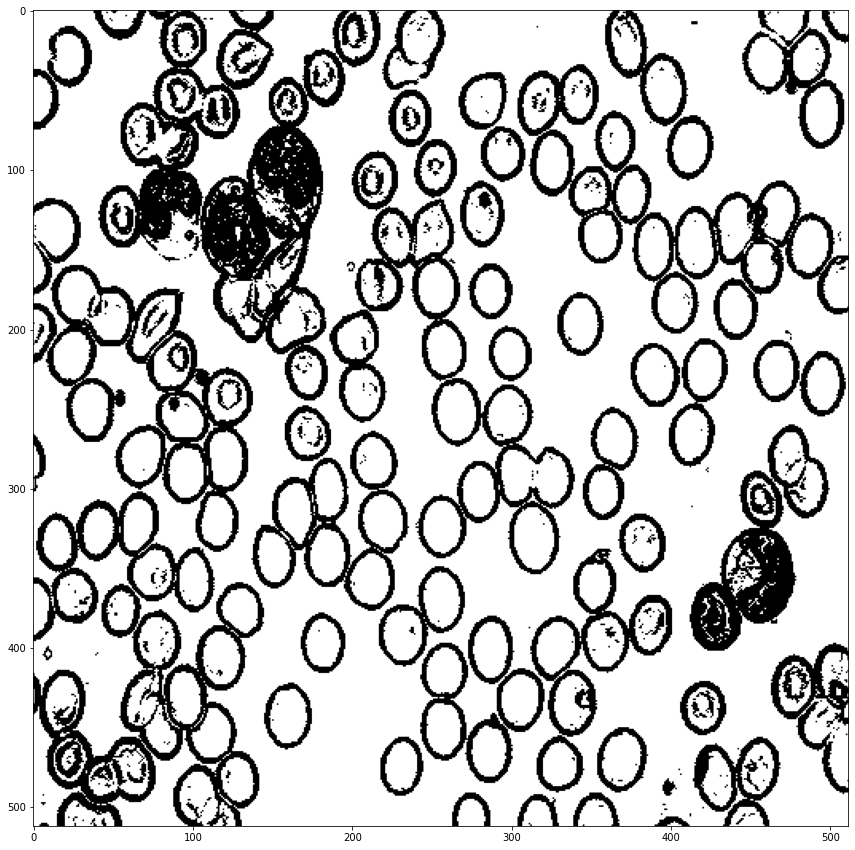

In [ ]:
thresh_grad = seuil(morpho_grad, 5)
plt.figure(figsize=(15,15))
plt.imshow(thresh_grad,cmap  ="gray")
plt.show()

- **Q** Apply the watershed algorithm to the gradient image using morpho.watershed(morpho_grad,k) ;
What do you observe ? 
- **A** :(code in the next cell) ...
- **Q** Try to change the parameter k ; what is the role of that parameter ?
- **A** :(code in the next cell) ...

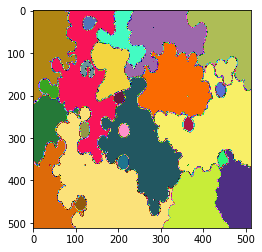

In [ ]:
import matplotlib
cmaprand = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))
if student :
  wat = morpho.watershed(morpho_grad, 40)

plt.imshow(wat, cmap =cmaprand)
plt.show()

- **Q** : Apply first a closing on the gradient image and then the watershed. Is the result better ? In which sense and why ?
- **A** : (code in the next cell) ...
- **Q** : Apply an opening with the same structuring element on the gradient image and then do a watershed. What is the difference between this operation and the previous? 
- **A** : (code in the next cell) ...

In [ ]:
if student :
  wat_closing = ...
plt.figure(figsize =(15,15))
plt.imshow(wat_closing,cmap =cmaprand)
plt.show()

In [ ]:
if student :
  wat_opening = ...
plt.figure(figsize =(15,15))
plt.imshow(wat_opening,cmap =cmaprand)
plt.show()

We now propose to try to do better than what you did with the closure and opening by using specific markers for the watershed transform.

**Q** : In the next cell, compute the reconstruction from an opening of the gradient. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : ...

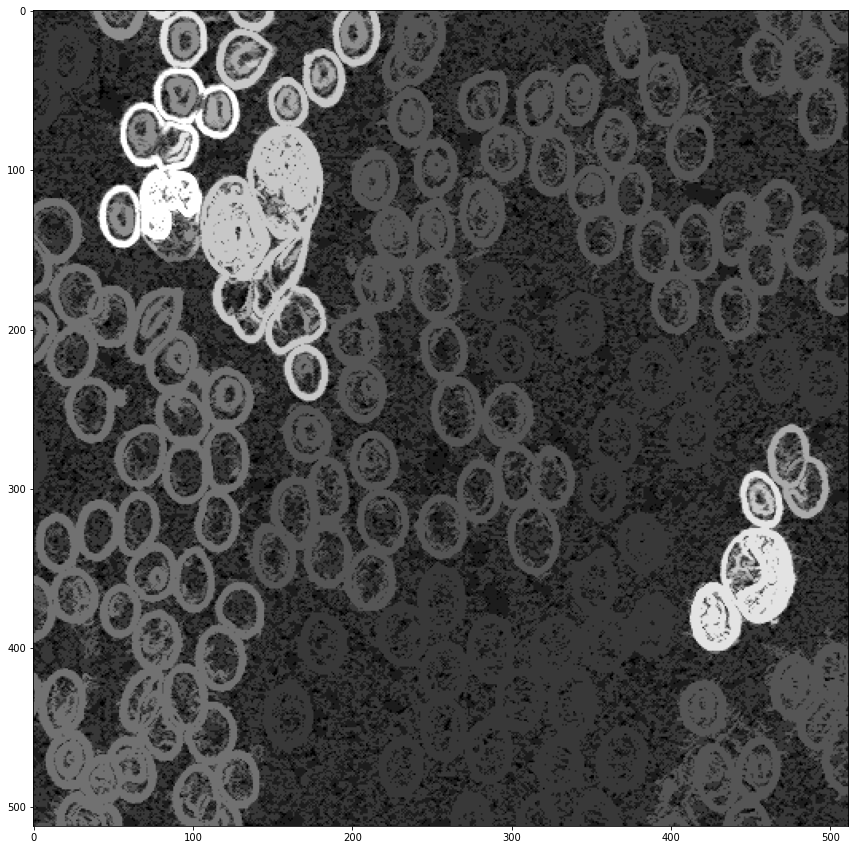

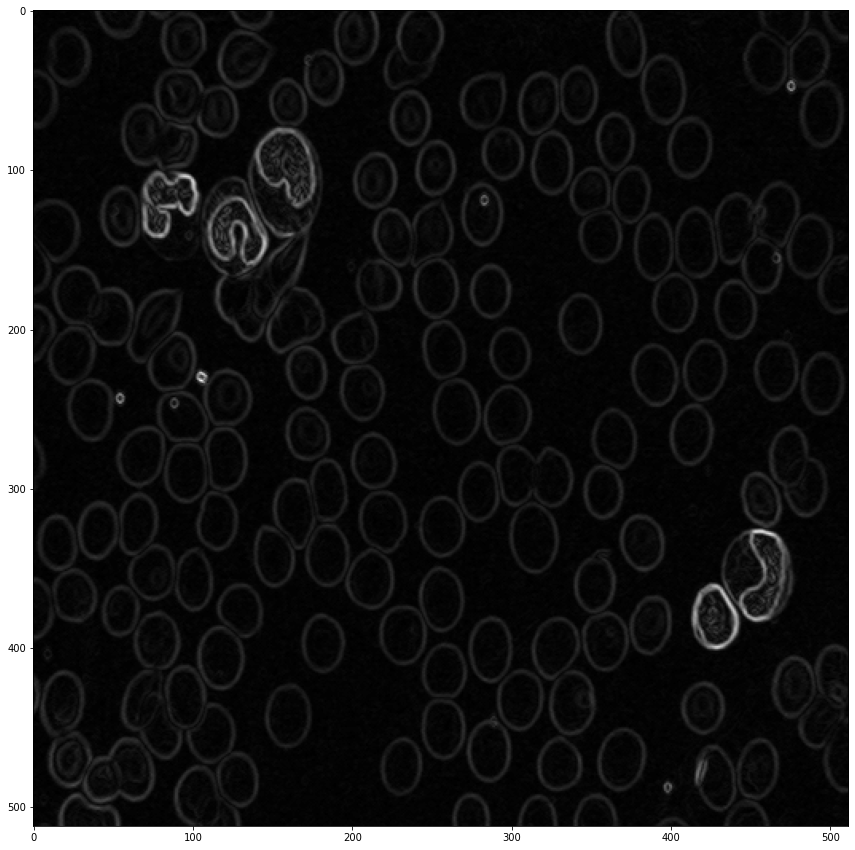

In [ ]:
imOpen = ...
reco=...
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()
plt.figure(figsize =(15,15))
plt.imshow(morpho_grad,cmap = "gray")
plt.show()

**Q** : In the next cell, compute the reconstruction from an closing of the gradient. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : ...

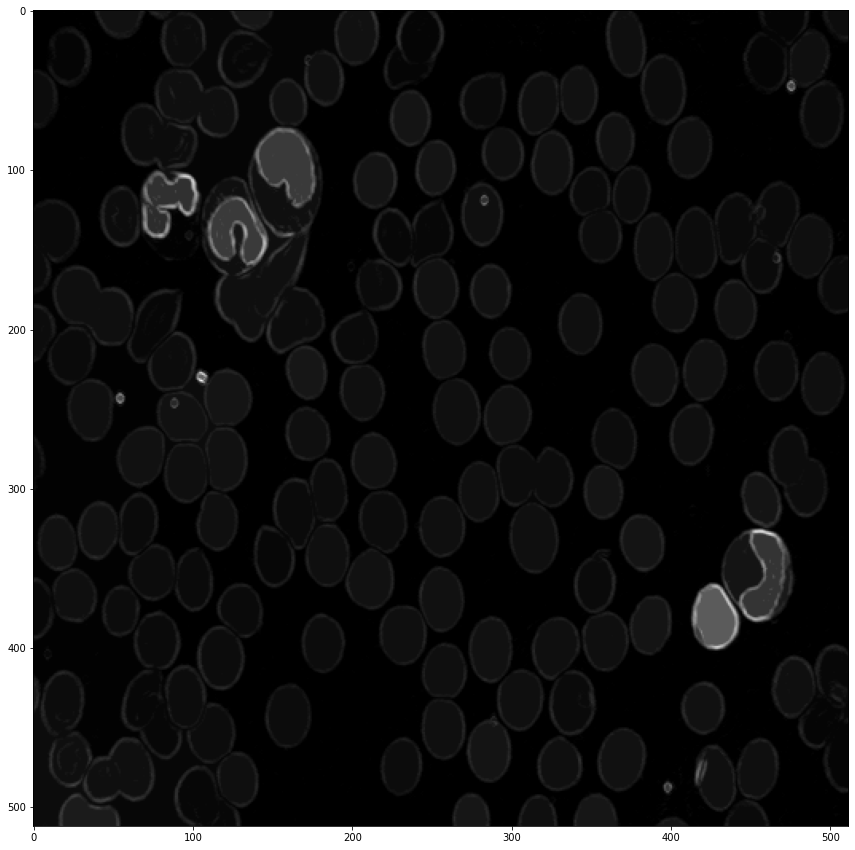

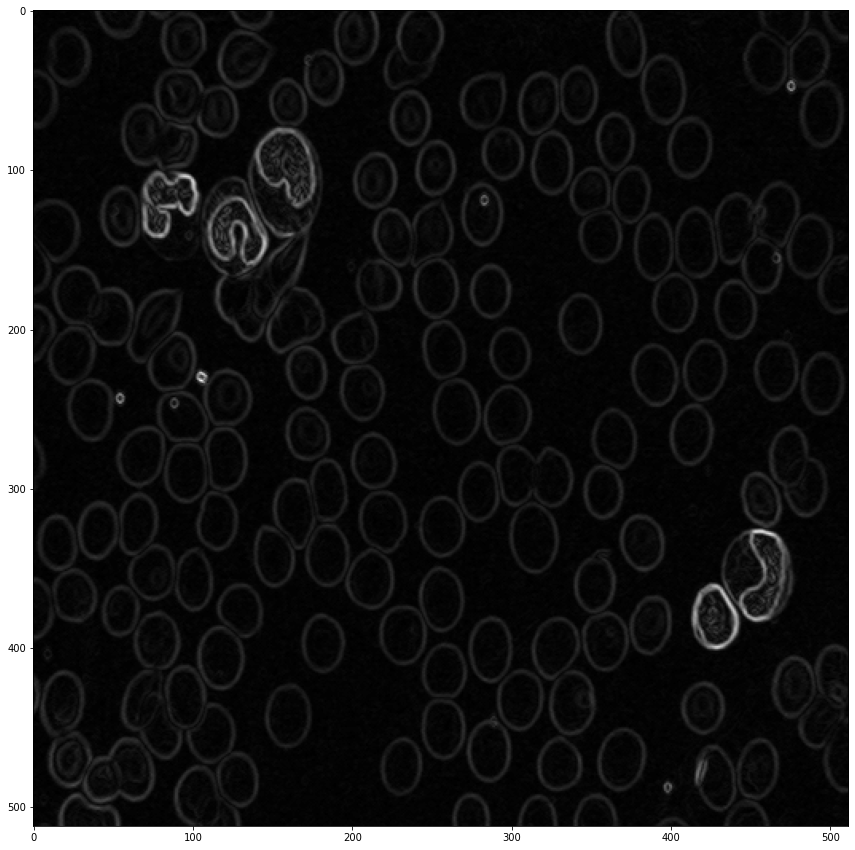

In [ ]:
imClos = ...
reco=...
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : Use the reconstruction operation and the above questions to find good markers for the watershed algorithm. You could benefit from using the peak_local_max function of skimage.feature

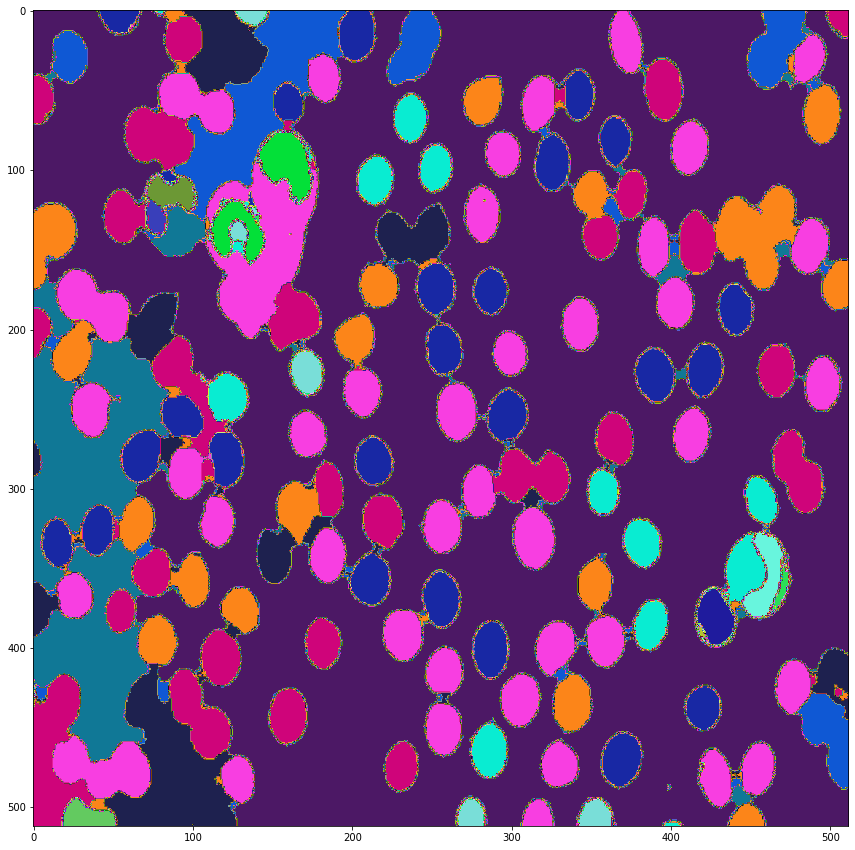

In [ ]:
plt.figure(figsize =(15,15))
plt.imshow(wat,cmap =cmaprand)
plt.show()